<a href="https://colab.research.google.com/github/tomo0530/CS767_Final_Project/blob/main/CS767_FinalProject_Tomotaka_Harada.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

* This code is designed to work on Google Colaboratory. It is recommended to enable GPU.

# Set Up

In [ ]:
# install and download some packages
!apt install --allow-change-held-packages libcudnn8=8.4.1.50-1+cuda11.6
!git clone --depth 1 https://github.com/tensorflow/models/
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=.

In [ ]:
# select detection model
modelName = "ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8" #@param ["ssd_resnet50_v1_fpn_1024x1024_coco17_tpu-8", "ssd_resnet101_v1_fpn_1024x1024_coco17_tpu-8", "ssd_resnet152_v1_fpn_1024x1024_coco17_tpu-8", "efficientdet_d4_coco17_tpu-32"]
modelURL = "http://download.tensorflow.org/models/object_detection/tf2/20200711/" + modelName + ".tar.gz"
modelFile = modelName + '.tar.gz'
modelCheckPointPath = modelName + '/checkpoint'
!wget {modelURL}
!tar -xf {modelFile}
!mv {modelCheckPointPath} models/research/object_detection/test_data/

In [ ]:
# write a file based on the setup script in the official repo
%%writefile models/research/setup.py

import os
from setuptools import find_packages
from setuptools import setup

REQUIRED_PACKAGES = [
    'tf-models-official==2.8.0',
    'tensorflow_io'
]

setup(
    name='object_detection',
    version='0.1',
    install_requires=REQUIRED_PACKAGES,
    include_package_data=True,
    packages=(
        [p for p in find_packages() if p.startswith('object_detection')] +
        find_packages(where=os.path.join('.', 'slim'))),
    package_dir={
        'datasets': os.path.join('slim', 'datasets'),
        'nets': os.path.join('slim', 'nets'),
        'preprocessing': os.path.join('slim', 'preprocessing'),
        'deployment': os.path.join('slim', 'deployment'),
        'scripts': os.path.join('slim', 'scripts'),
    },
    description='Tensorflow Object Detection Library',
    python_requires='>3.6',
)

In [ ]:
!python -m pip install models/research

In [ ]:
import os
import random
import io
import pickle
import glob
import shutil
import time

import scipy.misc
import numpy as np
import imageio
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display, Javascript
from IPython.display import Image as IPyImage
import imageio

import tensorflow as tf
tf.random.set_seed(1234)
 
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder
from object_detection.utils import colab_utils

# Preprocessing

In [ ]:
# download pikachu image dataset
!pip install --upgrade --no-cache-dir gdown
!gdown --id '1x68bEgyuUT9iGQFMitASMKYm-G1KSJPk'
!unzip pikachu_dataset.zip

In [7]:
def load_image_into_numpy_array(path):
    """
    Loads an image from file into a numpy array
    :param path: a file path
    :return: uint8 numpy array with shape (img_height, img_width, 3)
    """
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size

    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)


def plot_detections(image_np, boxes, classes, scores, category_index,
                    figsize=(12, 16), image_name=None):
    """
    Visualizes detections with bounding boxes
    :param image_np: a numpy array of image
    :param boxes: a numpy array of bounding boxes
    :param classes: a numpy array of classes
    :param scores: a numpy array of scores
    :param category_index: a dict containing category dictionaries
    :param figsize: size for the figure
    :param image_name: a name for the image file
    :return: None
    """
    image_np_with_annotations = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_annotations,
        boxes,
        classes,
        scores,
        category_index,
        use_normalized_coordinates=True,
        min_score_thresh=0.8)

    if image_name:
        plt.imsave(image_name, image_np_with_annotations)

    else:
        plt.imshow(image_np_with_annotations)


In [8]:
# convert training images to numpy array
trainingPath = "/content/pikachu_dataset/training"
train_images_np = []

for i in range(1, 41):
    image_path = os.path.join(trainingPath, 'pikachu (' + str(i) + ').jpg')
    train_images_np.append(load_image_into_numpy_array(image_path))

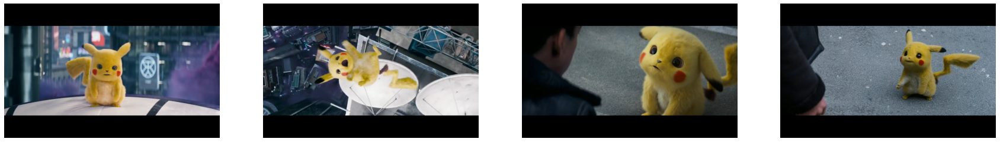

In [9]:
# plot training images
import matplotlib.pyplot as plt
%matplotlib inline

plt.figure(figsize=(30, 15))
for idx in range(4):
    plt.subplot(1, 4, idx+1)
    plt.axis('off')
    plt.imshow(train_images_np[idx])

plt.show()

In [ ]:
# Option 1
# annotate the training images manually
gt_boxes = []
colab_utils.annotate(train_images_np, box_storage_pointer=gt_boxes)

In [10]:
# Option 2
# load the pre-annotated ground truth boxes 
gt_boxes_path = os.path.join(trainingPath, "gt_boxes.pickle")
gt_boxes = []
with open(gt_boxes_path, mode="rb") as f:
    gt_boxes = pickle.load(f)

In [11]:
# define a dictionary describing the pikachu class
pikachu_class_id = 1
category_index = {pikachu_class_id : 
  {'id'  : pikachu_class_id, 
   'name': 'Pikachu'}
}

# convert numpy array to tensor, do one-hot encoding and add to list
num_classes = 1
label_id_offset = 1
train_image_tensors = []
gt_classes_one_hot_tensors = []
gt_box_tensors = []

for (train_image_np, gt_box_np) in zip(train_images_np, gt_boxes):    
    train_image_tensors.append(tf.expand_dims(tf.convert_to_tensor(
        train_image_np, dtype=tf.float32), axis=0))

    gt_box_tensors.append(tf.convert_to_tensor(gt_box_np, dtype=tf.float32))

    zero_indexed_groundtruth_classes = tf.convert_to_tensor(
        np.ones(shape=[gt_box_np.shape[0]], dtype=np.int32) - label_id_offset)

    gt_classes_one_hot_tensors.append(tf.one_hot(
        zero_indexed_groundtruth_classes, num_classes))

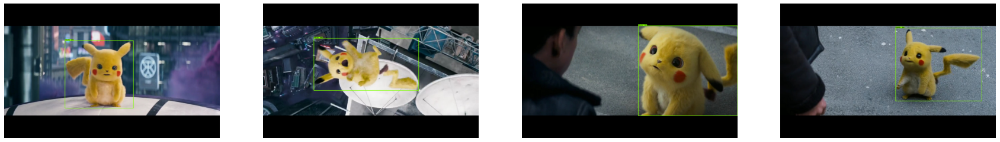

In [12]:
# plot the training images with bounding boxes
dummy_scores = np.array([1.0], dtype=np.float32)
plt.figure(figsize=(30, 15))
for idx in range(4):
    plt.subplot(2, 4, idx+1)
    plt.axis('off')
    plot_detections(
      train_images_np[idx],
      gt_boxes[idx],
      np.ones(shape=[gt_boxes[idx].shape[0]], dtype=np.int32),
      dummy_scores, category_index)

plt.show()

# Training

In [12]:
tf.keras.backend.clear_session()

# define the model configuration
if modelName == "efficientdet_d4_coco17_tpu-32":
  pipeline_config = 'models/research/object_detection/configs/tf2/ssd_efficientdet_d4_1024x1024_coco17_tpu-32.config'
else:
  pipeline_config = f'models/research/object_detection/configs/tf2/{modelName}.config'    

configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True

# build the custom model
detection_model = model_builder.build(
      model_config=model_config, is_training=True)

In [ ]:
# define checkpoints for feature extractor and box predictor
tmp_box_predictor_checkpoint = tf.train.Checkpoint(
  _base_tower_layers_for_heads = detection_model._box_predictor._base_tower_layers_for_heads,
  _box_prediction_head=detection_model._box_predictor._box_prediction_head,
)

tmp_model_checkpoint = tf.train.Checkpoint(
    _feature_extractor=detection_model._feature_extractor,
    _box_predictor=tmp_box_predictor_checkpoint
)

# restore the checkpoint to the checkpoint path
checkpoint_path = 'models/research/object_detection/test_data/checkpoint/ckpt-0'
checkpoint = tf.train.Checkpoint(model=tmp_model_checkpoint)
checkpoint.restore(checkpoint_path)

In [14]:
# run a dummy image to generate the model variables
tmp_image, tmp_shapes = detection_model.preprocess(tf.zeros([1, 1024, 1024, 3]))
tmp_prediction_dict = detection_model.predict(tmp_image, tmp_shapes)
tmp_detections = detection_model.postprocess(tmp_prediction_dict, tmp_shapes)

# define a list that contains the layers that I wish to fine tune
to_fine_tune = []
prefixes_to_train = [
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead',
  'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead']

for var in detection_model.trainable_variables:
  if any([var.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(var)

In [15]:
@tf.function
def train_step_fn(image_list, groundtruth_boxes_list, groundtruth_classes_list,
                  model, optimizer, vars_to_fine_tune):
    """
    A single training iteration of detection model
    :param image_list: a list of image tensors
    :param groundtruth_boxes_list: a list of groundtruth box tensors
    :param groundtruth_classes_list: a list of groundtruth class tensors
    :param model: a detection model
    :param optimizer: an optimizer
    :param vars_to_fine_tune: a list of trainable variables
    :return: a tensor of the total loss
    """
    model.provide_groundtruth(
        groundtruth_boxes_list=groundtruth_boxes_list,
        groundtruth_classes_list=groundtruth_classes_list)

    with tf.GradientTape() as tape:
        preprocessed_image_list = []
        true_shape_list = []

        for img in image_list:
            processed_img, true_shape = model.preprocess(img)
            preprocessed_image_list.append(processed_img)
            true_shape_list.append(true_shape)

        preprocessed_image_tensor = tf.concat(preprocessed_image_list, axis=0)
        true_shape_tensor = tf.concat(true_shape_list, axis=0)
        prediction_dict = model.predict(preprocessed_image_tensor,
                                        true_shape_tensor)
        losses_dict = model.loss(prediction_dict, true_shape_tensor)

        total_loss = losses_dict['Loss/localization_loss'] + losses_dict[
            'Loss/classification_loss']
        gradients = tape.gradient(total_loss, vars_to_fine_tune)
        optimizer.apply_gradients(zip(gradients, vars_to_fine_tune))

    return total_loss


In [16]:
# set the initial values
batch_size = 40
num_batches = 100
optimizer = tf.keras.optimizers.Adam()

In [17]:
# train the detection model
start = time.time()
for idx in range(num_batches):
    all_keys = list(range(len(train_images_np)))
    random.shuffle(all_keys)
    example_keys = all_keys[:batch_size]

    gt_boxes_list = [gt_box_tensors[key] for key in example_keys]
    gt_classes_list = [gt_classes_one_hot_tensors[key] for key in example_keys]    
    image_tensors = [train_image_tensors[key] for key in example_keys]

    total_loss = train_step_fn(image_tensors, 
                               gt_boxes_list, 
                               gt_classes_list,
                               detection_model,
                               optimizer,
                               to_fine_tune
                              )

    if idx % 10 == 0:
        print('batch ' + str(idx) + ' of ' + str(num_batches)
        + ', loss=' +  str(total_loss.numpy()), flush=True)

print('final loss=' +  str(total_loss.numpy()))
process_time = time.time() - start
print(f'It took {int(process_time)} sec.')

batch 0 of 100, loss=1.3456266
batch 10 of 100, loss=0.28102592
batch 20 of 100, loss=0.19403696
batch 30 of 100, loss=0.14637733
batch 40 of 100, loss=0.12102561
batch 50 of 100, loss=0.103962846
batch 60 of 100, loss=0.09173249
batch 70 of 100, loss=0.08237221
batch 80 of 100, loss=0.07496991
batch 90 of 100, loss=0.06882507
final loss=0.06408684
It took 121 sec.


# CNN Visualization

In [18]:
def visualize_intermediate_activations(layer_names, activations):
    """
    Visualizes every channel in an intermediate activation
    :param layer_names: a list of layer names
    :param activations: an activation layer
    :return: None
    """
    images_per_row = 16
    for layer_name, layer_activation in zip(layer_names, activations):
        nb_features = layer_activation.shape[-1]
        size = layer_activation.shape[1]

        nb_cols = nb_features // images_per_row
        grid = np.zeros((size * nb_cols, size * images_per_row))

        for col in range(nb_cols):
            for row in range(images_per_row):
                feature_map = layer_activation[0, :, :,
                              col * images_per_row + row]
                feature_map *= 255
                feature_map = np.clip(feature_map, 0, 255).astype(np.uint8)

                grid[col * size:(col + 1) * size,
                row * size:(row + 1) * size] = feature_map

        scale = 1. / size
        plt.figure(
            figsize=(scale * grid.shape[1] * 1.6, scale * grid.shape[0]))
        plt.title(layer_name)
        plt.grid(False)
        plt.axis('off')
        plt.imshow(grid, aspect='auto', cmap='viridis')
    plt.show()


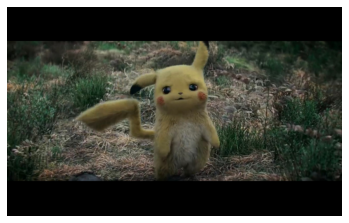

In [19]:
# plot the original image
k = 24
plt.axis('off')
plt.imshow(train_images_np[k])

In [20]:
# preprocess the image by the model
tmp_input_tensor = train_image_tensors[k]
tmp_preprocessed_image, tmp_shapes = detection_model.preprocess(tmp_input_tensor)
tmp_prediction_dict = detection_model.predict(tmp_preprocessed_image, tmp_shapes)

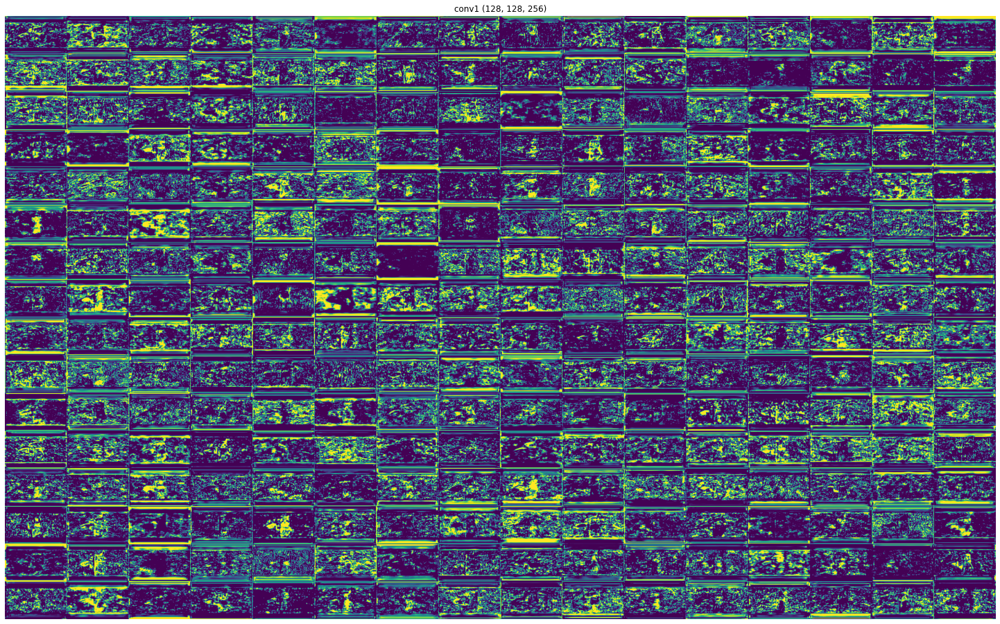

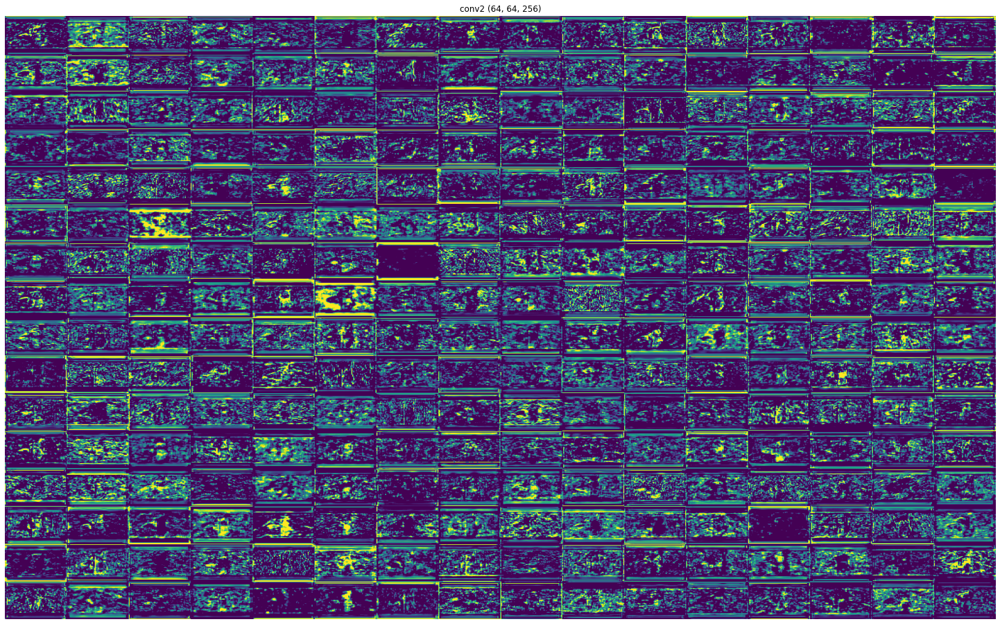

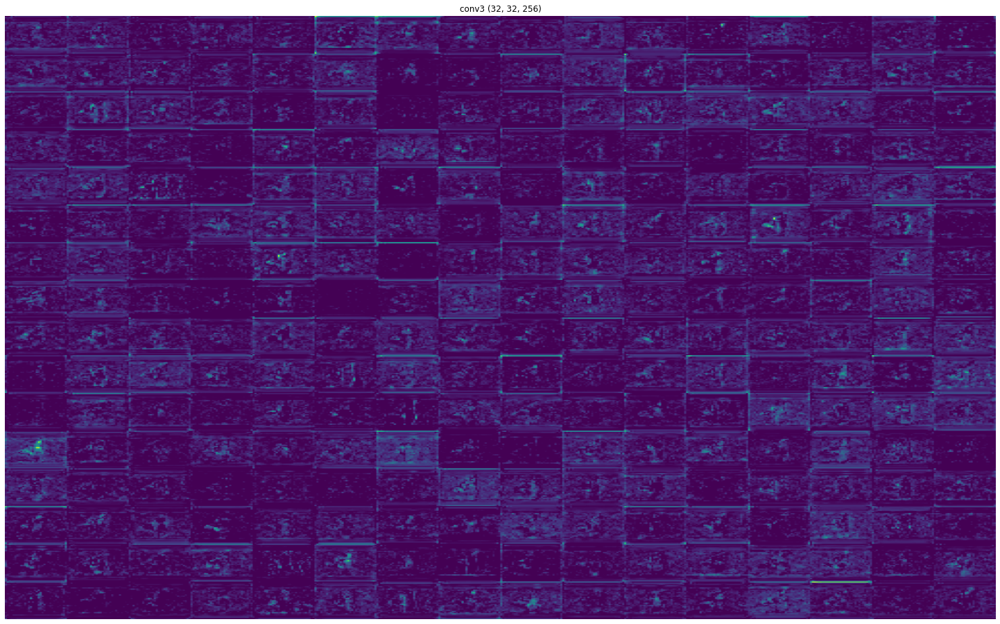

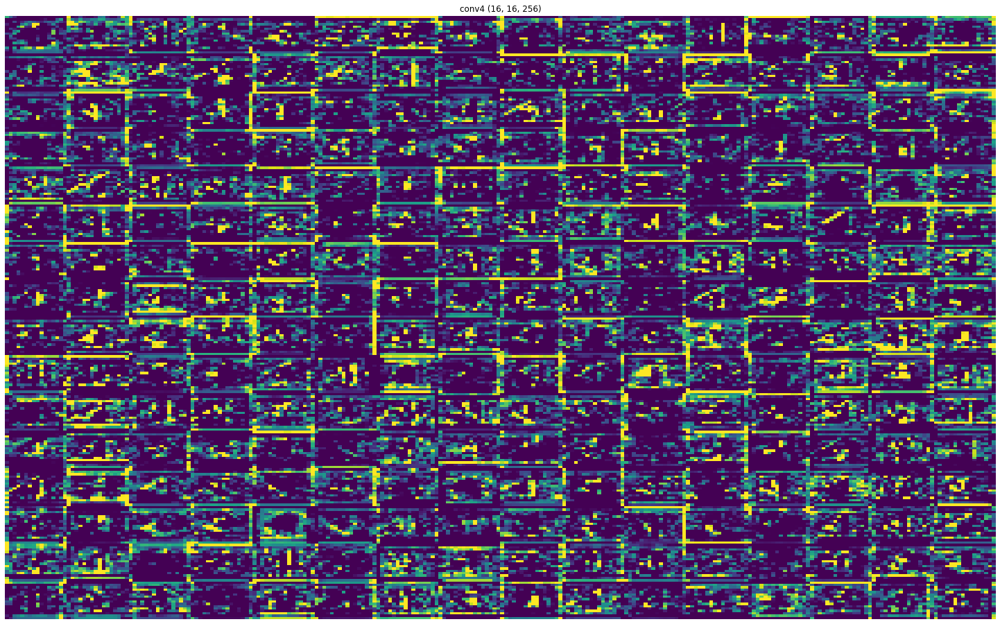

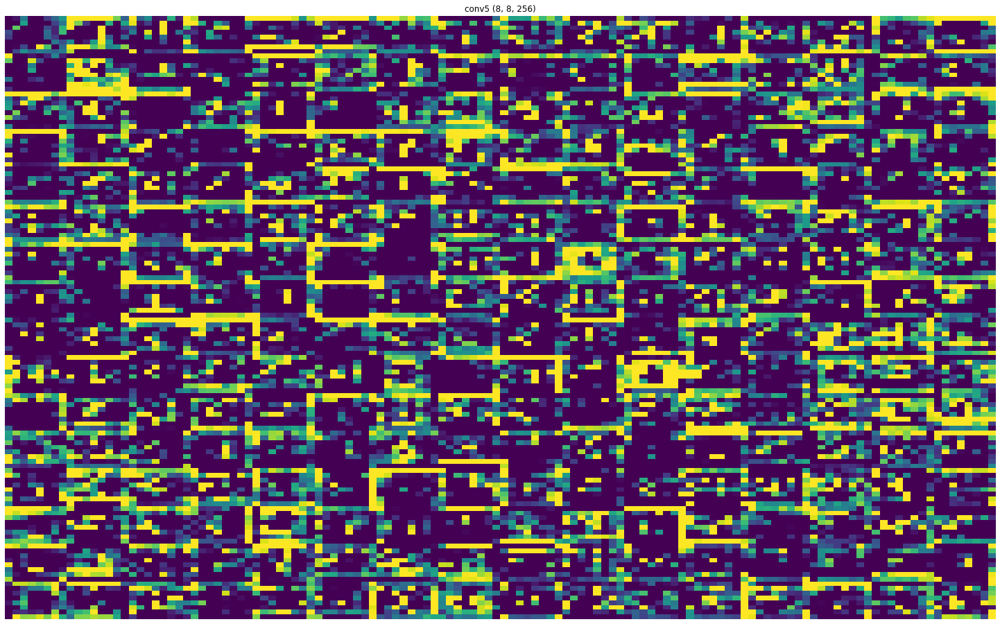

In [21]:
# plot the feature maps
layer_names = ['conv1 (128, 128, 256)', 'conv2 (64, 64, 256)', 
               'conv3 (32, 32, 256)', 'conv4 (16, 16, 256)', 
               'conv5 (8, 8, 256)']
visualize_intermediate_activations(activations=tmp_prediction_dict['feature_maps'], 
                                   layer_names=layer_names)

# Prediction

In [22]:
@tf.function
def detect(input_tensor, model):
    """
    Runs detection on an input image
    :param input_tensor: a tensor of image
    :param model: a trained model
    :return: three tensors of boxes, classes, and scores
    """
    preprocessed_image, shapes = model.preprocess(input_tensor)
    prediction_dict = model.predict(preprocessed_image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections


In [23]:
# load test images into numpy array
testPath = '/content/pikachu_dataset/test'
testPath2 = '/content/pikachu_dataset/test2'
test_images_np = []
test_images_np2 = []

for i in range(1, 241):
    image_path = os.path.join(testPath, 'pikachu (' + str(i) + ').jpg')
    test_images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))
    
for i in range(1, 7):
    image_path = os.path.join(testPath2, 'Pikachu (' + str(i) + ').jpg')
    test_images_np2.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))

In [24]:
# detect Pikachu from test images and save the result
label_id_offset = 1

for i in range(len(test_images_np)):
    input_tensor = tf.convert_to_tensor(test_images_np[i], dtype=tf.float32)
    detections = detect(input_tensor, detection_model)
    plot_detections(
      test_images_np[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name=testPath + "/gif_frame_" + ('%03d' % i) + ".jpg")

for i in range(len(test_images_np2)):
    input_tensor = tf.convert_to_tensor(test_images_np2[i], dtype=tf.float32)
    detections = detect(input_tensor, detection_model)
    plot_detections(
      test_images_np2[i][0],
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.uint32)
      + label_id_offset,
      detections['detection_scores'][0].numpy(),
      category_index, figsize=(15, 20), image_name=testPath2 + "/gif_frame_" + ('%03d' % i) + ".jpg")

Frame 80


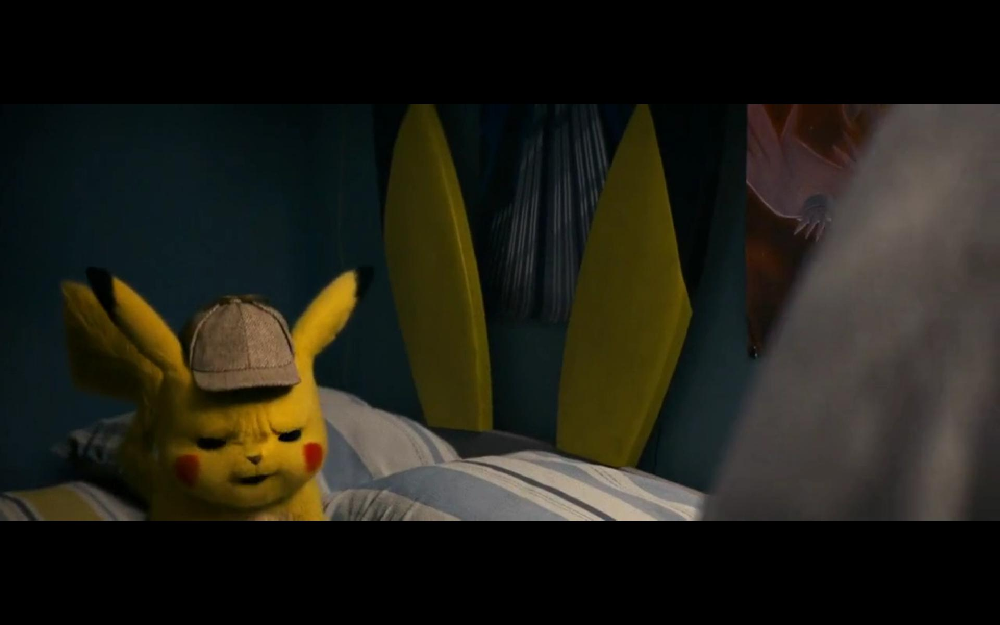

Frame 140


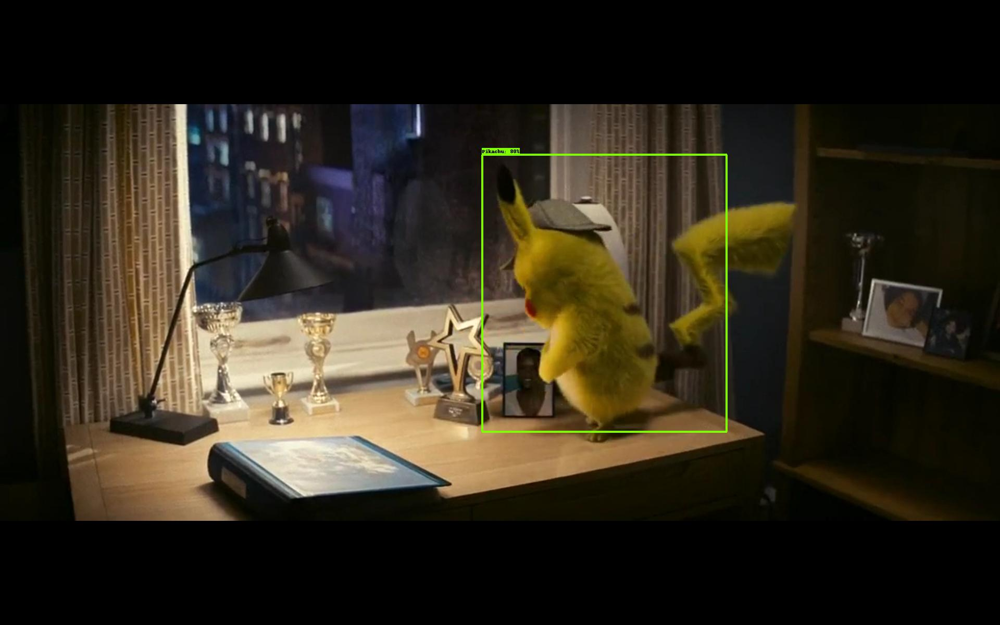

Frame 200


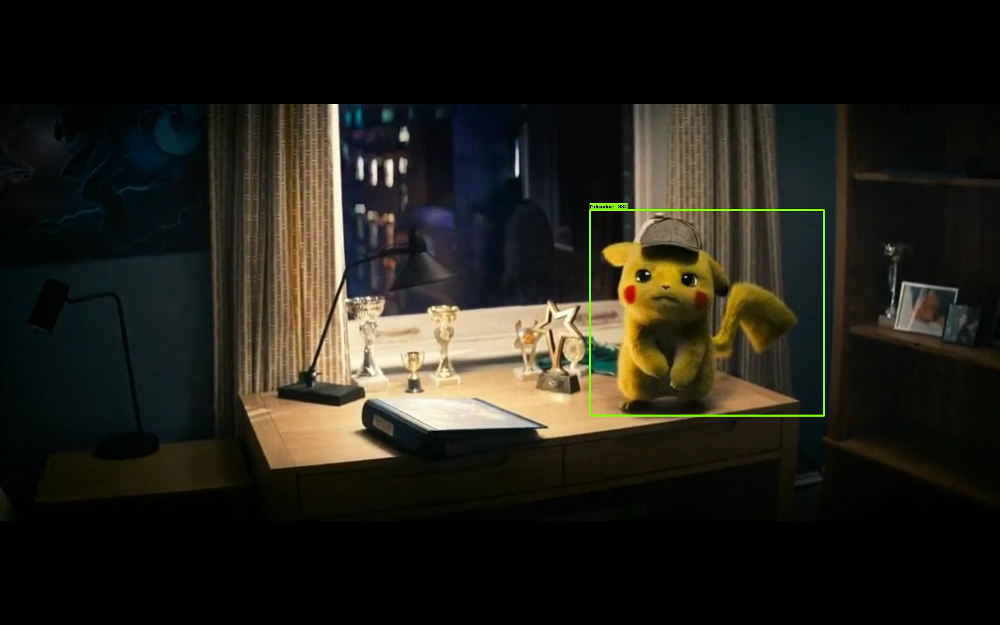

In [25]:
# print Pikachu images
print('Frame 80')
display(IPyImage(testPath + '/gif_frame_080.jpg'))
print('Frame 140')
display(IPyImage(testPath + '/gif_frame_140.jpg'))
print('Frame 200')
display(IPyImage(testPath + '/gif_frame_200.jpg'))

Frame 1


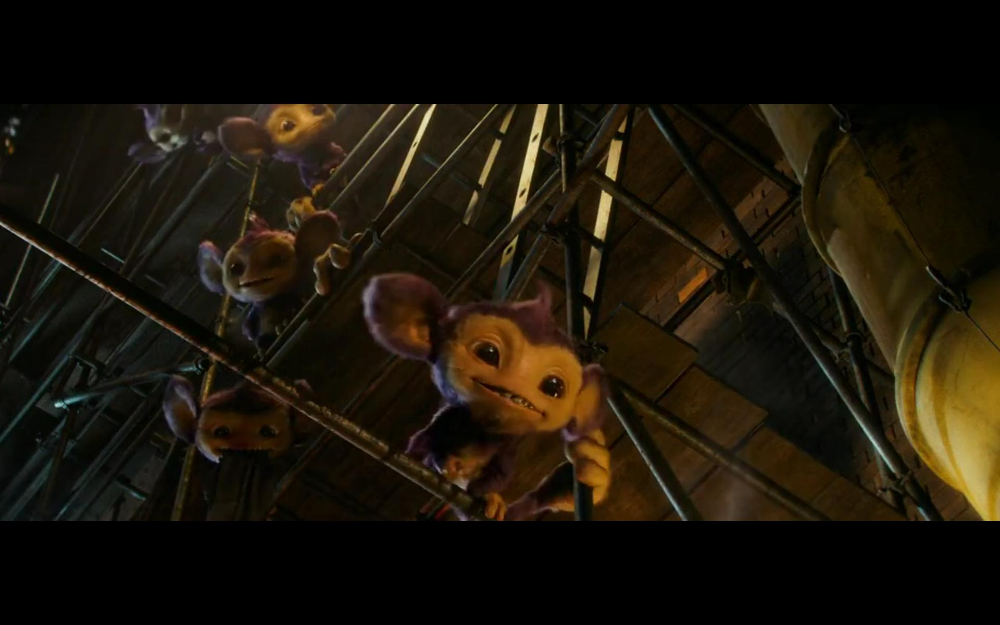

Frame 2


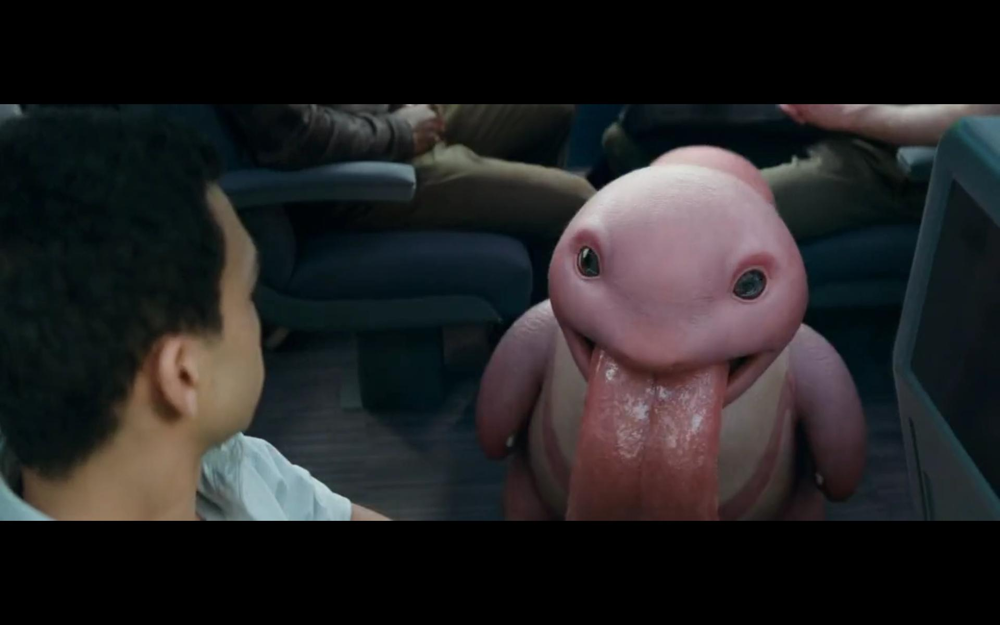

Frame 3


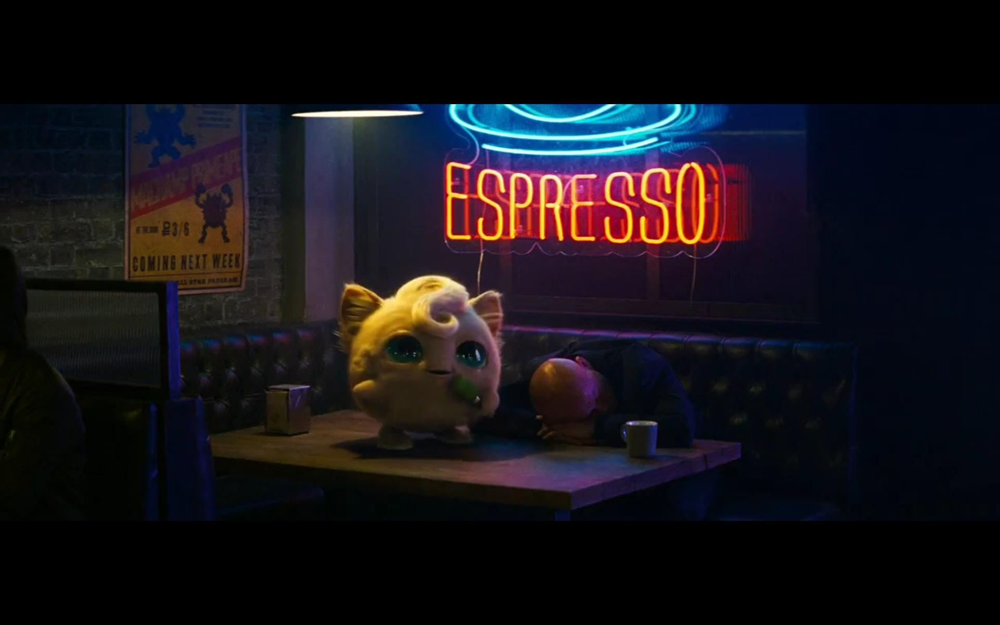

Frame 4


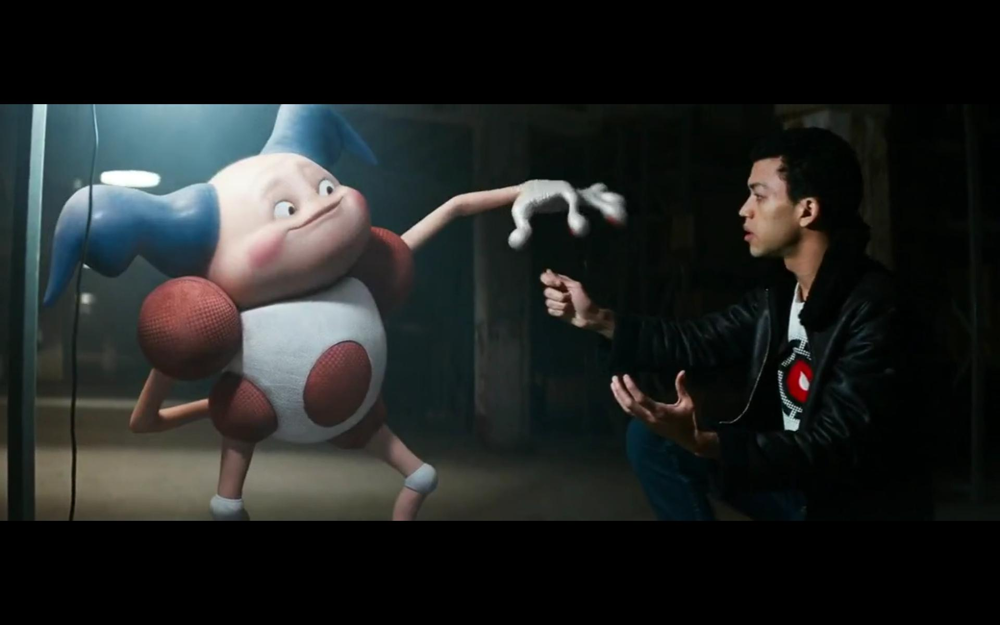

Frame 5


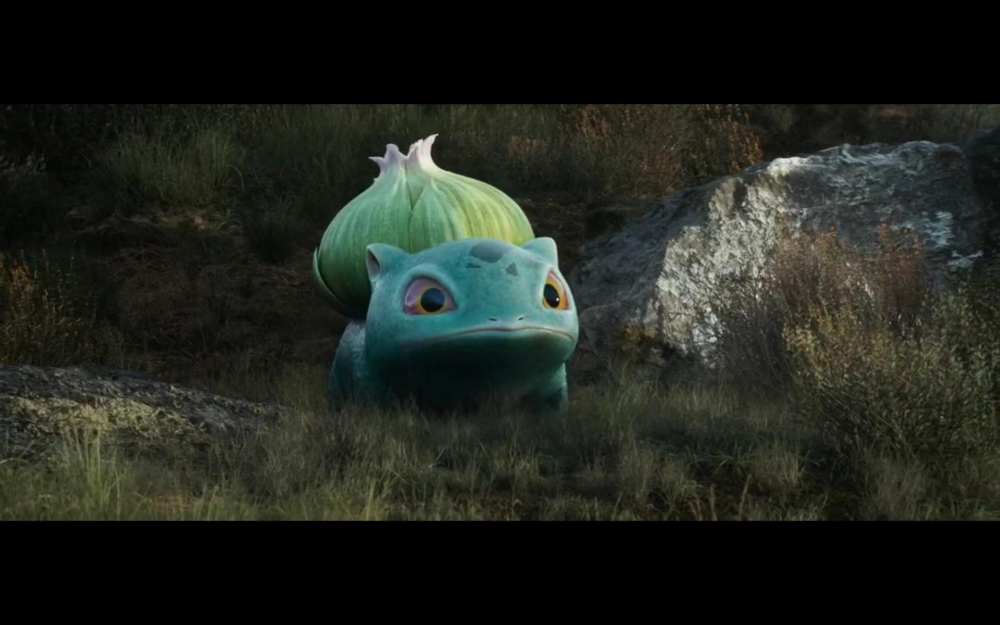

Frame 6


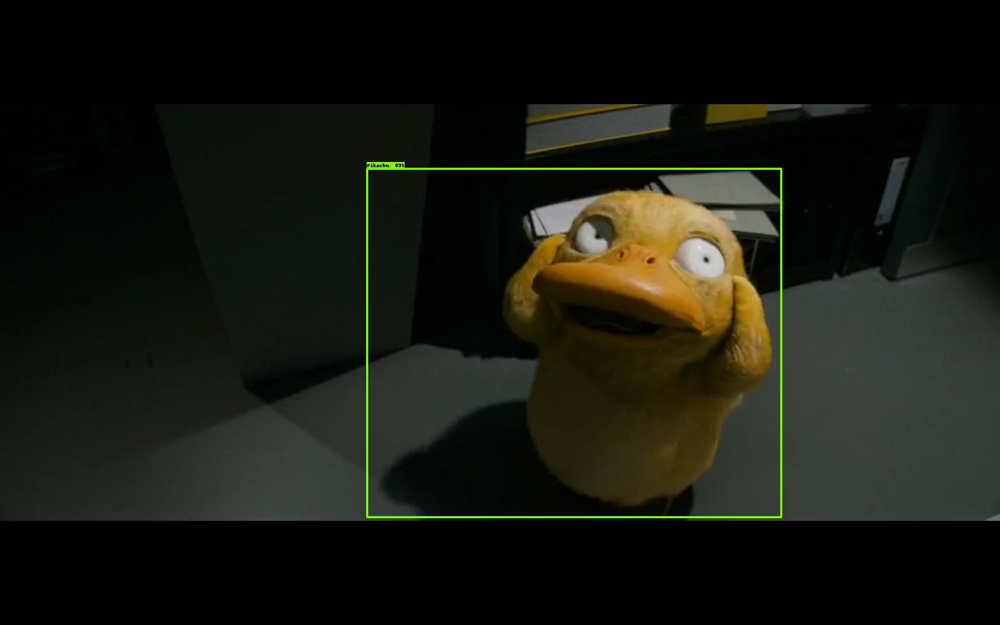

In [26]:
# print other pokemon images
for i in range(6):
  print(f'Frame {i+1}')
  display(IPyImage(testPath2 + f'/gif_frame_00{i}.jpg'))

In [ ]:
# save the detected test images as gif
imageio.plugins.freeimage.download()
anim_file = './pikachu-anim.gif'

filenames = glob.glob(testPath + '/gif_frame_*.jpg')
filenames = sorted(filenames)
last = -1
images = []

for filename in filenames:
    image = imageio.imread(filename)
    images.append(image)

imageio.mimsave(anim_file, images, 'GIF-FI', fps=10)